## **Import Libraries**

In [1]:
from glob import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import *
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from keras.metrics import Precision, Recall, AUC
from sklearn.metrics import confusion_matrix
import seaborn as sns
from google.colab import drive
import time
import os
import datetime
import pandas as pd

## **Connect to Google Drive and Update Dataset Path**

In [2]:
drive.mount('/content/drive')
dataset_path = "/content/drive/MyDrive/Dataset_BUSI_with_GT-3"
!cp -r /content/drive/MyDrive/Dataset_BUSI_with_GT-3 /content

dataset_path = 'Dataset_BUSI_with_GT-3/*/*.png'

Mounted at /content/drive


## **PreProcessing Data**

In [49]:
#Preprocess the image
def preprocess_image(path, size):
    image = cv2.imread(path)
    image = cv2.resize(image, (size, size)) #Resize the image
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) #Convert the image to grayscale
    image = image / 255.0
    return image

#Create the dataset from the images
def create_dataset(size):
    images = []
    masks = []

    masks_detected = 0
    total_img= 1
    for image_path in sorted(glob(dataset_path)):
        #dont include the normal image folder in the dataset as it is not needed
        if 'normal' in image_path:
            continue #skip the normal folder

        else:
            img = preprocess_image(image_path, size)
            #If there are masks in the image
            if '_mask' in image_path:
                #If there are multiple masks in the image
                if masks_detected:
                    masks[-1] = masks[-1] + img
                    masks[-1] = np.array(masks[-1]>0.5, dtype='float64')
                else:
                    #Add the mask to the list
                    masks.append(img)
                    masks_detected = 1
            else:
                images.append(img)
                masks_detected = 0

            total_img = total_img + 1
    return np.array(images), np.array(masks)

## **Train/Validation/Test Split**

In [4]:
size = 256
def load_dataset(size):
  total_images, total_masks = create_dataset(size)

  #output the text in green color with size 14
  print("\033[93m" + "Data has been loaded successfully!" + "\033[0m")
  print("Total Images detected: ", len(total_images))
  print("Total Masks detected: ", len(total_masks))

  return total_images, total_masks

total_images, total_masks = load_dataset(size)

Data has been loaded successfully!
Total Images detected:  647
Total Masks detected:  647


In [5]:
def get_dataset(total_images, total_masks, size):
  #shuffle the data
  total_images, total_masks = shuffle(total_images, total_masks, random_state=42) #random state 42 is used to ensure the same shuffle every time the code is run

  #verify the shuffle
  print("\033[93m" + "Data has been shuffled successfully!" + "\033[0m")
  print("Total Images detected: ", len(total_images))
  print("Total Masks detected: ", len(total_masks))

  # Split the data into training, validation and test sets and then split the testing set into test and validation set
  X_train, X_test, y_train, y_test = train_test_split(total_images, total_masks, test_size=0.1, random_state=42)
  X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

  #Check the total training, validation, and testing images
  print("\033[93m" + "Data has been reshaped successfully!" + "\033[0m")
  print("Training Images: ", len(X_train))
  print("Validation Images: ", len(X_val))
  print("Testing Images: ", len(X_test))

  #Reshape the data to fit the model (size, size, channels), channels = 1 for grayscale or 3 for RGB
  X_train = X_train.reshape(-1, size, size, 1)
  y_train = y_train.reshape(-1, size, size, 1)
  X_val = X_val.reshape(-1, size, size, 1)
  y_val = y_val.reshape(-1, size, size, 1)
  X_test = X_test.reshape(-1, size, size, 1)
  y_test = y_test.reshape(-1, size, size, 1)

  #Verify the shape of the data
  print("\033[93m" + "Data has been reshaped successfully!" + "\033[0m")
  print("Shape of Training Images: ", X_train.shape)
  print("Shape of Training Masks: ", y_train.shape)
  print("Shape of Validation Images: ", X_val.shape)
  print("Shape of Validation Masks: ", y_val.shape)
  print("Shape of Testing Images: ", X_test.shape)
  print("Shape of Testing Masks: ", y_test.shape)

  return X_train, X_val, X_test, y_train, y_val, y_test

#Create dataset with image size 128x128
input_size=128
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks, input_size)

Data has been shuffled successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been reshaped successfully!
Training Images:  582
Validation Images:  32
Testing Images:  33
Data has been reshaped successfully!
Shape of Training Images:  (2328, 128, 128, 1)
Shape of Training Masks:  (2328, 128, 128, 1)
Shape of Validation Images:  (128, 128, 128, 1)
Shape of Validation Masks:  (128, 128, 128, 1)
Shape of Testing Images:  (132, 128, 128, 1)
Shape of Testing Masks:  (132, 128, 128, 1)


## **Loss Functions**

In [6]:
#if the predicted mask is 80 percent similar to the actual mask, then it is a good prediction otherwise it is a bad prediction
def dice_coef(y_true, y_pred):
    y_true_f = tf.cast(tf.reshape(y_true, [-1]), tf.float32)
    y_pred_f = tf.cast(tf.reshape(y_pred, [-1]), tf.float32)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + 1) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + 1)

def get_dicecoef(y_true, y_pred):
    #Calculate the dice coefficient for the test data
    dice = dice_coef(y_test, y_pred)
    print("Dice Coefficient: ", dice.numpy())

    #calculate the correctly images that were classified as good predictions
    correct_5 = 0
    correct_7 = 0
    correct_9 = 0

    for i in range(len(y_test)):
        dice = dice_coef(y_test[i], y_pred[i])
        if dice > 0.5:
            correct_5 += 1
        if dice > 0.7:
            correct_7 += 1
        if dice > 0.9:
            correct_9 += 1

    print("Correctly classified images with 50% similarity: ", correct_5)
    print("Correctly classified images with 70% similarity: ", correct_7)
    print("Correctly classified images with 90% similarity: ", correct_9)
    print("Total images: ", len(y_test))

#Dice loss
def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return 1 - numerator / denominator

#Combined Loss of binary crossentropy and dice loss
def combined_loss(y_true, y_pred):
    return tf.keras.losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

## **U-Net Architecture**

In [7]:
def unet_model(input_shape):
    input_layer = Input(input_shape) #layer 0
    #print(input_layer.shape)

    #Downsampling
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(input_layer) #layer 1
    conv1 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv1) #layer 2
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1) #layer 3


    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool1) #layer 3
    conv2 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv2) #layer 4
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2) #layer 5

    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool2) #layer 6
    conv3 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv3) #layer 7
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3) #layer 8

    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool3) #layer 9
    conv4 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(conv4) #layer 10
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv4) #layer 11

    #Bottle neck layer
    bottle_neck = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(pool4) #layer 12
    bottle_neck = Conv2D(1024, 3, activation='relu', padding='same', kernel_initializer='he_normal')(bottle_neck) #layer 13

    #Upsampling
    upsampling1 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(bottle_neck) #layer 14
    upconv1 = concatenate([upsampling1, conv4], axis=3) #layer 15
    upconv1 = Conv2D(512, 3, activation='relu', padding='same', kernel_initializer='he_normal')(upconv1) #layer 16

    upconv2 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(upconv1) #layer 17
    upconv2 = concatenate([upconv2, conv3]) #layer 18
    upconv2 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(upconv2) #layer 19
    upconv2 = Conv2D(256, 3, activation='relu', padding='same', kernel_initializer='he_normal')(upconv2) #layer 20

    upconv3 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(upconv2) #layer 21
    upconv3 = concatenate([upconv3, conv2]) #layer 22
    upconv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(upconv3) #layer 23
    upconv3 = Conv2D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal')(upconv3) #layer 24

    upconv4 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(upconv3) #layer 25
    upconv4 = concatenate([upconv4, conv1]) #layer 26
    upconv4 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(upconv4) #layer 27
    upconv4 = Conv2D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal')(upconv4) #layer 28

    #Output layer
    output_layer = Conv2D(1, 1, padding="same", activation="sigmoid")(upconv4) #layer 29

    #Create the model
    model = Model(input_layer, output_layer, name="U-Net")
    return model

## **Model 1 - Training**

In [ ]:
%load_ext tensorboard
%tensorboard --logdir logs/fit
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('model1_unet_binaryloss_128.h5', save_best_only=True)

<IPython.core.display.Javascript object>

In [ ]:
input_size = 128
model = unet_model(input_shape=(input_size, input_size, 1))
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy' ,Precision(), Recall()])
model_history = model.fit(X_train, y_train, epochs = 100, validation_data = (X_val, y_val), callbacks=[tensorboard_callback, model_checkpoint])

Epoch 1/100
19/19 [==============================] - ETA: 0s - loss: 0.4216 - accuracy: 0.8732 - precision: 0.0875 - recall: 0.0315

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


19/19 [==============================] - 33s 551ms/step - loss: 0.4216 - accuracy: 0.8732 - precision: 0.0875 - recall: 0.0315 - val_loss: 0.3590 - val_accuracy: 0.9100 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/100
19/19 [==============================] - 5s 288ms/step - loss: 0.3277 - accuracy: 0.9023 - precision: 0.9000 - recall: 2.8989e-05 - val_loss: 0.2387 - val_accuracy: 0.9100 - val_precision: 1.0000 - val_recall: 8.4803e-05
Epoch 3/100
19/19 [==============================] - 5s 290ms/step - loss: 0.2422 - accuracy: 0.9036 - precision: 0.8320 - recall: 0.0163 - val_loss: 0.2053 - val_accuracy: 0.9127 - val_precision: 0.9650 - val_recall: 0.0310
Epoch 4/100
19/19 [==============================] - 5s 244ms/step - loss: 0.2272 - accuracy: 0.9105 - precision: 0.6777 - recall: 0.1598 - val_loss: 0.2231 - val_accuracy: 0.9109 - val_precision: 1.0000 - val_recall: 0.0099
Epoch 5/100
19/19 [==============================] - 5s 288ms/step - loss: 0.2278 - accuracy: 0

In [ ]:
#Extract the weights to Google Drive
model.save_weights('model1_unet_binaryloss_128.h5')
!cp model1_unet_binaryloss_128.h5 /content/drive/MyDrive

## **Model 1 Testing**

In [10]:
#Evaluate the model on the test dataset
def evaluate_model(X_test, y_test):
  loss, accuracy, precision, recall = model.evaluate(X_test, y_test)
  print("\033[93m" + "Model has been evaluated successfully!" + "\033[0m")
  print("Total Images: ", len(X_test))
  print("Accuracy: ", accuracy)
  print("Precision: ", precision)
  print("Recall: ", recall)
  print("F1 Score: ", 2 * (precision * recall) / (precision + recall))
  print("Loss: ", loss)

#Plot the evaluation metrics for the model on the test dataset using graph
def plot_evaluation_metrics(model, X_test, y_test):
    y_pred = model.predict(X_test)
    y_pred = np.array(y_pred > 0.5, dtype='float64')
    y_test = np.array(y_test > 0.5, dtype='float64')  # convert y_test to binary
    cm = confusion_matrix(y_test.flatten(), y_pred.flatten())
    sns.heatmap(cm, annot=True, fmt='g', cmap='Blues', xticklabels=['Background', 'Tumor'], yticklabels=['Background', 'Tumor'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix for the Test Data for each pixel')
    plt.show()

#Get the predicted mask for the test image from each layer of the model
def get_predictions(model, image):
    image = np.expand_dims(image, 0)
    predictions = [model.layers[i].output for i in range(1, len(model.layers)-1)]
    model = Model(inputs=model.inputs, outputs=predictions)
    return model.predict(image)

#plot graphs
def plot_graphs ():
  history_df = pd.DataFrame(model_history.history)
  history_df['epoch'] = model_history.epoch
  history_df.head()

  plt.figure(figsize=(8, 6))
  plt.plot(history_df['epoch'], history_df['loss'], label='loss')
  plt.plot(history_df['epoch'], history_df['val_loss'], label='val_loss')
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend()
  plt.grid(True)
  plt.title('Loss')
  plt.show()

  plt.figure(figsize=(8, 6))
  plt.plot(history_df['epoch'], history_df['accuracy'], label='accuracy')
  plt.plot(history_df['epoch'], history_df['val_accuracy'], label='val_accuracy')
  plt.xlabel('Epoch')
  plt.ylabel('Accuracy')
  plt.legend()
  plt.grid(True)
  plt.show()

#Plot the images
def plot_predictions(X_test, size, start):
  #Predictions for the test dataset
  predictions = model.predict(X_test)

  #Plot the first 3 images with image, actual mask, and predicted mask
  plt.figure(figsize=(10, 20))
  for i in range(3):
      plt.subplot(5, 3, i*3+1)
      plt.imshow(X_test[start+i].reshape(size, size), cmap='gray')
      plt.title("Ultrasound Image", color='black', size=20)
      plt.axis('off')

      plt.subplot(5, 3, i*3+2)
      plt.imshow(X_test[start+i].reshape(size, size), cmap='gray')
      plt.imshow(y_test[start+i].reshape(size, size), cmap='jet', alpha=0.5)
      plt.title("Ground Truth Mask", color='red', size=20)
      plt.axis('off')

      plt.subplot(5, 3, i*3+3)
      plt.imshow(X_test[start+i].reshape(size, size), cmap='gray')
      plt.imshow(predictions[start+i].reshape(size, size), cmap='viridis', alpha=0.5)
      plt.title("Predicted Mask", color='green', size=20)
      plt.axis('off')
  plt.tight_layout()
  plt.show()

In [50]:
input_size = 128
total_images, total_masks = load_dataset(input_size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks, input_size)

# Define the model
model = unet_model(input_shape=(input_size, input_size, 1))

# Load the pretrained weights
model.load_weights('/content/drive/MyDrive/model1_unet_binaryloss_128.h5')

# Compile the model with the necessary configurations
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy', Precision(), Recall()])

# Print the model summary to check the architecture and parameters
#model.summary()

Data has been loaded successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been shuffled successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been reshaped successfully!
Training Images:  582
Validation Images:  32
Testing Images:  33
Data has been reshaped successfully!
Shape of Training Images:  (582, 128, 128, 1)
Shape of Training Masks:  (582, 128, 128, 1)
Shape of Validation Images:  (32, 128, 128, 1)
Shape of Validation Masks:  (32, 128, 128, 1)
Shape of Testing Images:  (33, 128, 128, 1)
Shape of Testing Masks:  (33, 128, 128, 1)


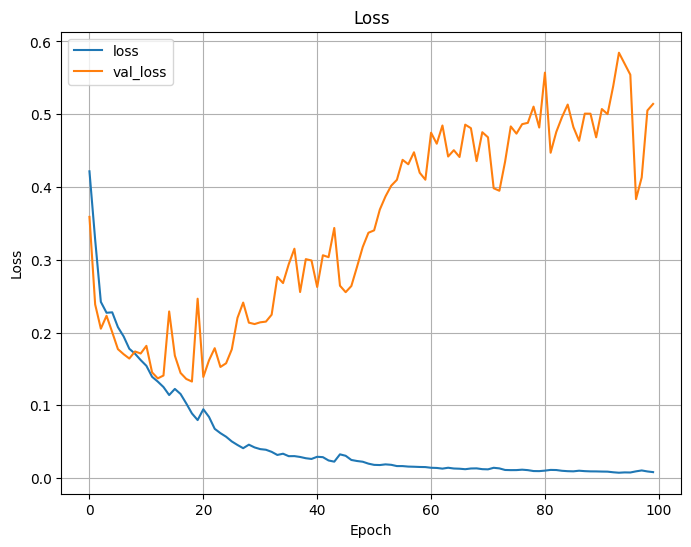

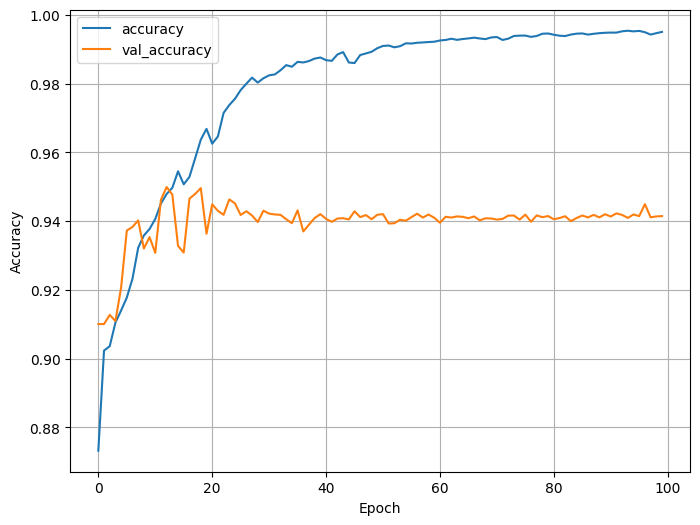

In [ ]:
plot_graphs()

In [51]:
evaluate_model(X_test, y_test)

2/2 [==============================] - 1s 19ms/step - loss: 0.3949 - accuracy: 0.9585 - precision_7: 0.7111 - recall_7: 0.6345
Model has been evaluated successfully!
Total Images:  33
Accuracy:  0.9585219621658325
Precision:  0.7110525369644165
Recall:  0.6344813704490662
F1 Score:  0.6705882113096834
Loss:  0.3949258327484131


In [52]:
#Test the model on the test dataset
y_pred = model.predict(X_test)
get_dicecoef(y_test, y_pred)

2/2 [==============================] - 0s 146ms/step
Dice Coefficient:  0.6662256
Correctly classified images with 50% similarity:  25
Correctly classified images with 70% similarity:  20
Correctly classified images with 90% similarity:  11
Total images:  33


2/2 [==============================] - 0s 147ms/step


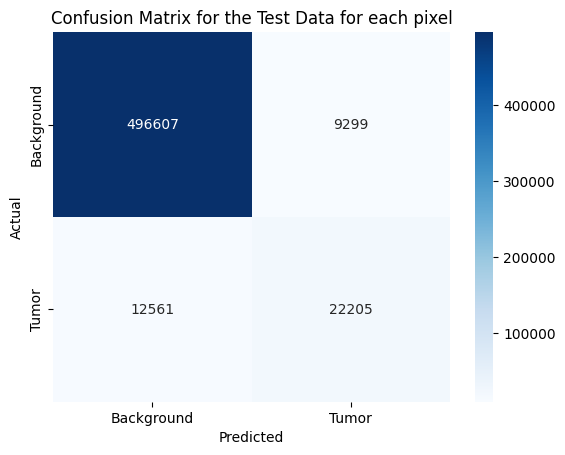

In [53]:
plot_evaluation_metrics(model, X_test, y_test)

2/2 [==============================] - 0s 146ms/step


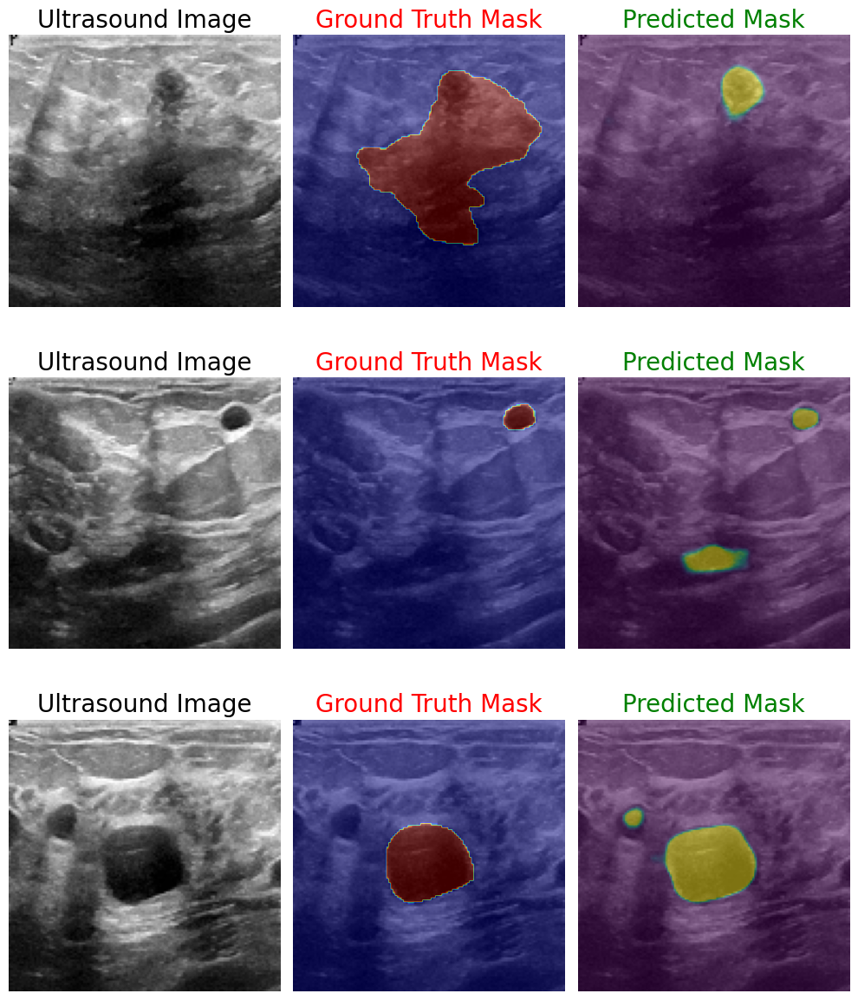

In [54]:
plot_predictions(X_test, 128,0)

## **Model 2 Training**

In [ ]:
input_size = 256
total_images, total_masks = load_dataset(input_size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks, input_size)

model = unet_model(input_shape=(input_size, input_size, 1))
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy' ,Precision(), Recall()])
#model.summary()

Data has been loaded successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been shuffled successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been reshaped successfully!
Training Images:  582
Validation Images:  32
Testing Images:  33
Data has been reshaped successfully!
Shape of Training Images:  (582, 256, 256, 1)
Shape of Training Masks:  (582, 256, 256, 1)
Shape of Validation Images:  (32, 256, 256, 1)
Shape of Validation Masks:  (32, 256, 256, 1)
Shape of Testing Images:  (33, 256, 256, 1)
Shape of Testing Masks:  (33, 256, 256, 1)


In [ ]:
#model.summary()

input_size = 256
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('model2_unet_binaryloss_256.h5', save_best_only=True)
model_history = model.fit(X_train, y_train, epochs = 100, validation_data = (X_val, y_val), callbacks=[tensorboard_callback, model_checkpoint])

Model: "U-Net"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_180 (Conv2D)         (None, 256, 256, 64)         640       ['input_11[0][0]']            
                                                                                                  
 conv2d_181 (Conv2D)         (None, 256, 256, 64)         36928     ['conv2d_180[0][0]']          
                                                                                                  
 max_pooling2d_40 (MaxPooli  (None, 128, 128, 64)         0         ['conv2d_181[0][0]']          
 ng2D)                                                                                        

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


19/19 [==============================] - 72s 1s/step - loss: 0.5060 - accuracy: 0.7561 - precision_10: 0.0932 - recall_10: 0.1709 - val_loss: 0.3607 - val_accuracy: 0.9101 - val_precision_10: 0.0000e+00 - val_recall_10: 0.0000e+00
Epoch 2/100
19/19 [==============================] - 16s 854ms/step - loss: 0.3551 - accuracy: 0.9023 - precision_10: 0.0000e+00 - recall_10: 0.0000e+00 - val_loss: 0.3427 - val_accuracy: 0.9101 - val_precision_10: 0.0000e+00 - val_recall_10: 0.0000e+00
Epoch 3/100
19/19 [==============================] - 16s 860ms/step - loss: 0.3128 - accuracy: 0.9023 - precision_10: 0.0000e+00 - recall_10: 0.0000e+00 - val_loss: 0.2635 - val_accuracy: 0.9101 - val_precision_10: 0.0000e+00 - val_recall_10: 0.0000e+00
Epoch 4/100
19/19 [==============================] - 16s 822ms/step - loss: 0.2737 - accuracy: 0.9023 - precision_10: 0.0000e+00 - recall_10: 0.0000e+00 - val_loss: 0.2805 - val_accuracy: 0.9101 - val_precision_10: 0.0000e+00 - val_recall_10: 0.0000e+00
Epoch 5

In [ ]:
#Extract the weights to Google Drive
model.save_weights('model2_unet_binaryloss_256.h5')
!cp model2_unet_binaryloss_256.h5 /content/drive/MyDrive

## **Model 2 Testing**

In [55]:
input_size = 256
total_images, total_masks = load_dataset(input_size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks, input_size)

# Define the model
model = unet_model(input_shape=(input_size, input_size, 1))

# Load the pretrained weights
model.load_weights('/content/drive/MyDrive/model2_unet_binaryloss_256.h5')

# Compile the model with the necessary configurations
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy', Precision(), Recall()])

# Print the model summary to check the architecture and parameters
#model.summary()

Data has been loaded successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been shuffled successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been reshaped successfully!
Training Images:  582
Validation Images:  32
Testing Images:  33
Data has been reshaped successfully!
Shape of Training Images:  (582, 256, 256, 1)
Shape of Training Masks:  (582, 256, 256, 1)
Shape of Validation Images:  (32, 256, 256, 1)
Shape of Validation Masks:  (32, 256, 256, 1)
Shape of Testing Images:  (33, 256, 256, 1)
Shape of Testing Masks:  (33, 256, 256, 1)


In [56]:
evaluate_model(X_test, y_test)

2/2 [==============================] - 1s 30ms/step - loss: 0.4147 - accuracy: 0.9574 - precision_8: 0.6963 - recall_8: 0.6398
Model has been evaluated successfully!
Total Images:  33
Accuracy:  0.9574182629585266
Precision:  0.6962869763374329
Recall:  0.6397533416748047
F1 Score:  0.6668240679132532
Loss:  0.41470807790756226


In [57]:
#Test the model on the test dataset
y_pred = model.predict(X_test)
get_dicecoef(y_test, y_pred)

2/2 [==============================] - 1s 432ms/step
Dice Coefficient:  0.6638045
Correctly classified images with 50% similarity:  24
Correctly classified images with 70% similarity:  19
Correctly classified images with 90% similarity:  10
Total images:  33


2/2 [==============================] - 0s 457ms/step


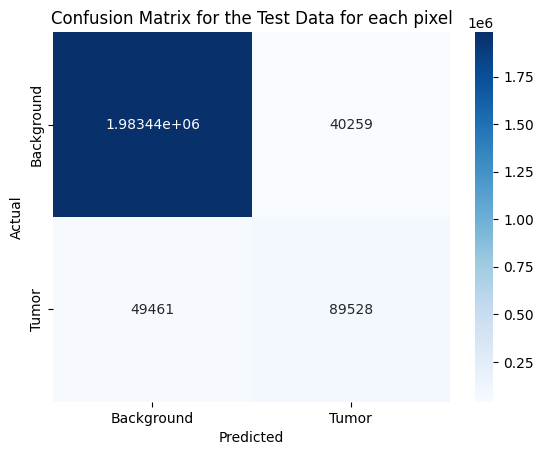

In [58]:
plot_evaluation_metrics(model, X_test, y_test)

2/2 [==============================] - 0s 433ms/step


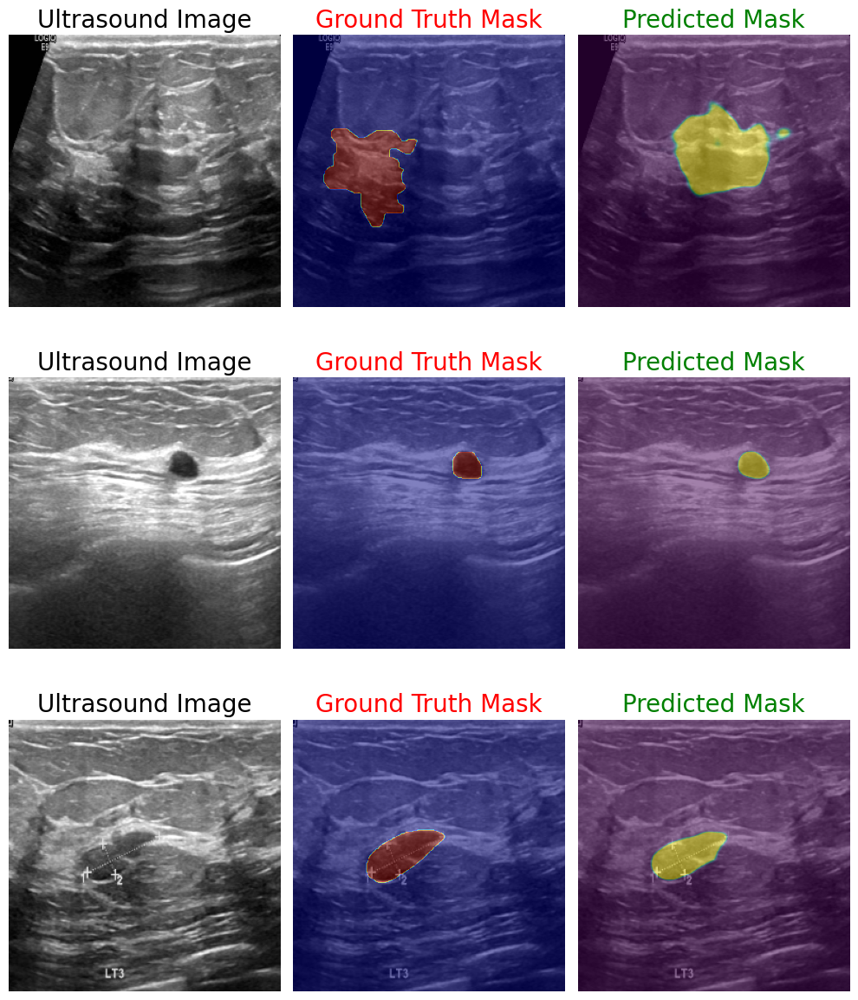

In [17]:
plot_predictions(X_test, 256, 5)

## **Model 3 Training**

In [ ]:
size = 128
total_images, total_masks = load_dataset(size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks)

Data has been loaded successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been shuffled successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been reshaped successfully!
Training Images:  582
Validation Images:  32
Testing Images:  33
Data has been reshaped successfully!
Shape of Training Images:  (582, 128, 128, 1)
Shape of Training Masks:  (582, 128, 128, 1)
Shape of Validation Images:  (32, 128, 128, 1)
Shape of Validation Masks:  (32, 128, 128, 1)
Shape of Testing Images:  (33, 128, 128, 1)
Shape of Testing Masks:  (33, 128, 128, 1)


In [ ]:
input_size = 128
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('model3_unet_customloss_128.h5', save_best_only=True)
model = unet_model(input_shape=(input_size, input_size, 1))
model.compile(optimizer=Adam(learning_rate=1e-4), loss=combined_loss, metrics=['accuracy' ,Precision(), Recall()])
model_history = model.fit(X_train, y_train, epochs = 100, validation_data = (X_val, y_val), callbacks=[tensorboard_callback, model_checkpoint])

Epoch 1/100
18/19 [===========================>..] - ETA: 0s - loss: 1.2224 - accuracy: 0.9025 - precision_34: 0.3636 - recall_34: 8.6924e-06

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


19/19 [==============================] - 12s 297ms/step - loss: 1.2213 - accuracy: 0.9023 - precision_34: 0.3913 - recall_34: 9.6631e-06 - val_loss: 1.1444 - val_accuracy: 0.9100 - val_precision_34: 0.0000e+00 - val_recall_34: 0.0000e+00
Epoch 2/100
19/19 [==============================] - 5s 245ms/step - loss: 0.9902 - accuracy: 0.9043 - precision_34: 0.5576 - recall_34: 0.0990 - val_loss: 1.1897 - val_accuracy: 0.9115 - val_precision_34: 1.0000 - val_recall_34: 0.0168
Epoch 3/100
19/19 [==============================] - 6s 302ms/step - loss: 0.9410 - accuracy: 0.8961 - precision_34: 0.4650 - recall_34: 0.4019 - val_loss: 0.7998 - val_accuracy: 0.9171 - val_precision_34: 0.5389 - val_recall_34: 0.5922
Epoch 4/100
19/19 [==============================] - 5s 288ms/step - loss: 0.7685 - accuracy: 0.9118 - precision_34: 0.5551 - recall_34: 0.5139 - val_loss: 0.6678 - val_accuracy: 0.9375 - val_precision_34: 0.6896 - val_recall_34: 0.5670
Epoch 5/100
19/19 [==============================] 

In [ ]:
#Extract the weights to Google Drive
model.save_weights('model3_unet_customloss_128.h5')
!cp model3_unet_customloss_128.h5 /content/drive/MyDrive

## **Model 3 Testing**

In [25]:
input_size = 128
total_images, total_masks = load_dataset(input_size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks, input_size)

# Define the model
model = unet_model(input_shape=(input_size, input_size, 1))

# Load the pretrained weights
model.load_weights('/content/drive/MyDrive/model3_unet_customloss_128.h5')
# Compile the model with the necessary configurations
model.compile(optimizer=Adam(learning_rate=1e-4), loss=combined_loss, metrics=['accuracy', Precision(), Recall()])

# Print the model summary to check the architecture and parameters
#model.summary()

Data has been loaded successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been shuffled successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been reshaped successfully!
Training Images:  582
Validation Images:  32
Testing Images:  33
Data has been reshaped successfully!
Shape of Training Images:  (582, 128, 128, 1)
Shape of Training Masks:  (582, 128, 128, 1)
Shape of Validation Images:  (32, 128, 128, 1)
Shape of Validation Masks:  (32, 128, 128, 1)
Shape of Testing Images:  (33, 128, 128, 1)
Shape of Testing Masks:  (33, 128, 128, 1)


In [26]:
evaluate_model(X_test, y_test)

2/2 [==============================] - 1s 22ms/step - loss: 0.1704 - accuracy: 0.9844 - precision_2: 0.8956 - recall_2: 0.8799
Model has been evaluated successfully!
Total Images:  33
Accuracy:  0.9844249486923218
Precision:  0.8956351280212402
Recall:  0.8799070715904236
F1 Score:  0.8877014388991114
Loss:  0.1704242080450058


In [27]:
#Test the model on the test dataset
y_pred = model.predict(X_test)

get_dicecoef(y_test, y_pred)

2/2 [==============================] - 0s 107ms/step
Dice Coefficient:  0.8746608
Correctly classified images with 50% similarity:  31
Correctly classified images with 70% similarity:  30
Correctly classified images with 90% similarity:  14
Total images:  33


2/2 [==============================] - 0s 144ms/step


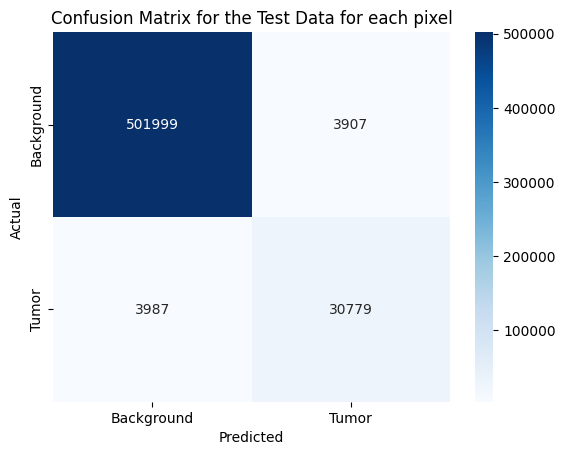

In [28]:
plot_evaluation_metrics(model, X_test, y_test)

2/2 [==============================] - 0s 100ms/step


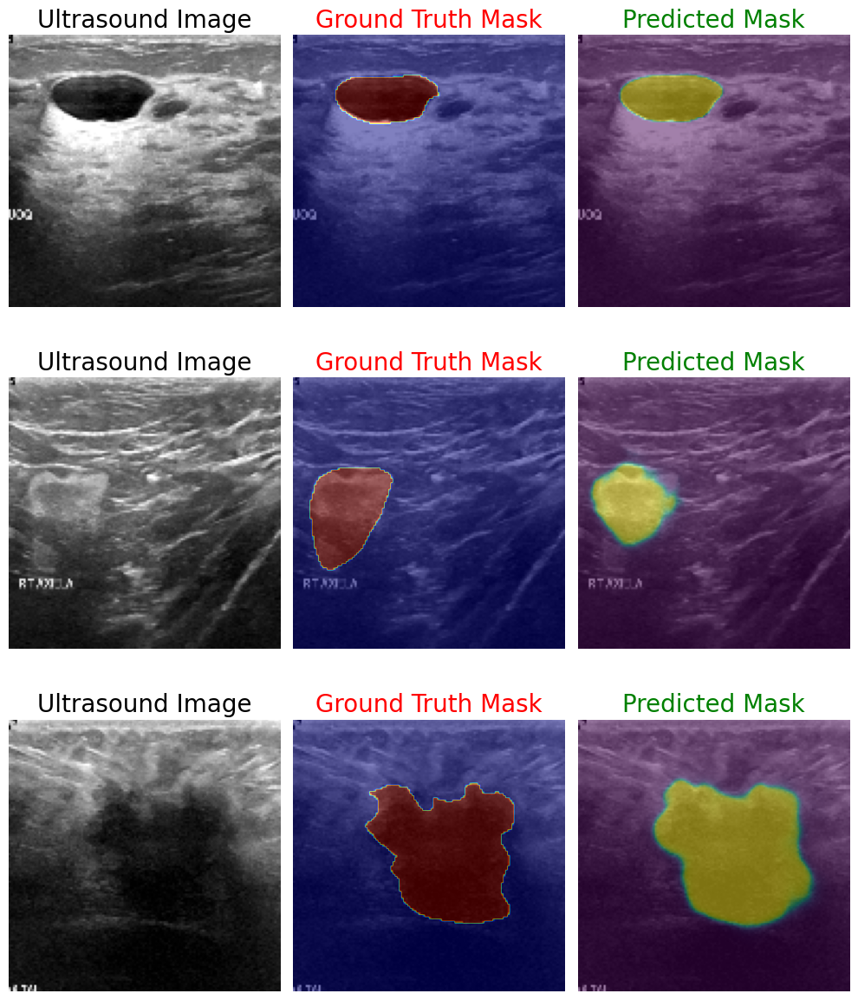

In [29]:
plot_predictions(X_test, 128, 10)

## **Model 4 Training**

In [ ]:
size = 256
total_images, total_masks = load_dataset(size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks)

Data has been loaded successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been shuffled successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been reshaped successfully!
Training Images:  582
Validation Images:  32
Testing Images:  33
Data has been reshaped successfully!
Shape of Training Images:  (582, 256, 256, 1)
Shape of Training Masks:  (582, 256, 256, 1)
Shape of Validation Images:  (32, 256, 256, 1)
Shape of Validation Masks:  (32, 256, 256, 1)
Shape of Testing Images:  (33, 256, 256, 1)
Shape of Testing Masks:  (33, 256, 256, 1)


In [ ]:
input_size = 256
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('model4_unet_customloss_256.h5', save_best_only=True)
model = unet_model(input_shape=(input_size, input_size, 1))
model.compile(optimizer=Adam(learning_rate=1e-4), loss=combined_loss, metrics=['accuracy' ,Precision(), Recall()])
model_history = model.fit(X_train, y_train, epochs = 100, validation_data = (X_val, y_val), callbacks=[tensorboard_callback, model_checkpoint])

Epoch 1/100
19/19 [==============================] - 22s 846ms/step - loss: 1.3021 - accuracy: 0.8245 - precision_36: 0.1188 - recall_36: 0.1238 - val_loss: 1.2141 - val_accuracy: 0.8991 - val_precision_36: 0.2636 - val_recall_36: 0.0681
Epoch 2/100
19/19 [==============================] - 15s 795ms/step - loss: 1.1717 - accuracy: 0.8714 - precision_36: 0.3002 - recall_36: 0.2365 - val_loss: 1.2176 - val_accuracy: 0.9102 - val_precision_36: 0.5045 - val_recall_36: 0.0794
Epoch 3/100
19/19 [==============================] - 16s 843ms/step - loss: 1.0922 - accuracy: 0.8846 - precision_36: 0.3933 - recall_36: 0.3307 - val_loss: 1.0179 - val_accuracy: 0.8960 - val_precision_36: 0.4231 - val_recall_36: 0.4227
Epoch 4/100
19/19 [==============================] - 15s 808ms/step - loss: 0.9761 - accuracy: 0.8863 - precision_36: 0.4221 - recall_36: 0.4346 - val_loss: 1.1997 - val_accuracy: 0.7768 - val_precision_36: 0.2433 - val_recall_36: 0.6968
Epoch 5/100
19/19 [=============================

In [ ]:
#Extract the weights to Google Drive
model.save_weights('model4_unet_customloss_256.h5')
!cp model4_unet_customloss_256.h5 /content/drive/MyDrive

## **Model 4 Testing**

In [30]:
input_size = 256
total_images, total_masks = load_dataset(input_size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks, input_size)

# Define the model
model = unet_model(input_shape=(input_size, input_size, 1))

# Load the pretrained weights
model.load_weights('/content/drive/MyDrive/model4_unet_customloss_256.h5')

# Compile the model with the necessary configurations
model.compile(optimizer=Adam(learning_rate=1e-4), loss=combined_loss, metrics=['accuracy', Precision(), Recall()])

# Print the model summary to check the architecture and parameters
#model.summary()

Data has been loaded successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been shuffled successfully!
Total Images detected:  647
Total Masks detected:  647
Data has been reshaped successfully!
Training Images:  582
Validation Images:  32
Testing Images:  33
Data has been reshaped successfully!
Shape of Training Images:  (582, 256, 256, 1)
Shape of Training Masks:  (582, 256, 256, 1)
Shape of Validation Images:  (32, 256, 256, 1)
Shape of Validation Masks:  (32, 256, 256, 1)
Shape of Testing Images:  (33, 256, 256, 1)
Shape of Testing Masks:  (33, 256, 256, 1)


In [31]:
evaluate_model(X_test, y_test)

2/2 [==============================] - 1s 29ms/step - loss: 0.8027 - accuracy: 0.9551 - precision_3: 0.6712 - recall_3: 0.6401
Model has been evaluated successfully!
Total Images:  33
Accuracy:  0.9551197290420532
Precision:  0.6712496280670166
Recall:  0.6401002407073975
F1 Score:  0.6553049780712064
Loss:  0.8027305006980896


In [32]:
#Test the model on the test dataset
y_pred = model.predict(X_test)

get_dicecoef(y_test, y_pred)

2/2 [==============================] - 1s 368ms/step
Dice Coefficient:  0.6527092
Correctly classified images with 50% similarity:  22
Correctly classified images with 70% similarity:  20
Correctly classified images with 90% similarity:  11
Total images:  33


2/2 [==============================] - 0s 375ms/step


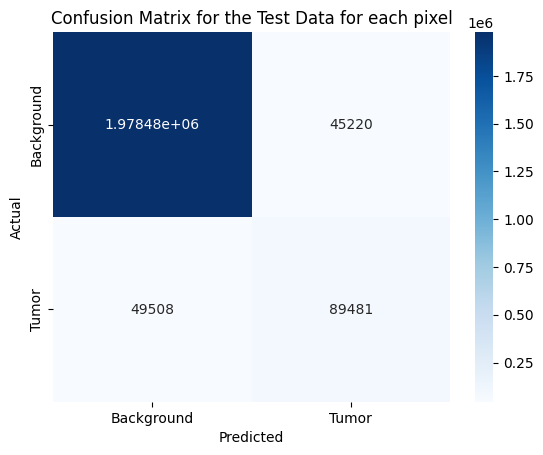

In [33]:
plot_evaluation_metrics(model, X_test, y_test)

2/2 [==============================] - 0s 431ms/step


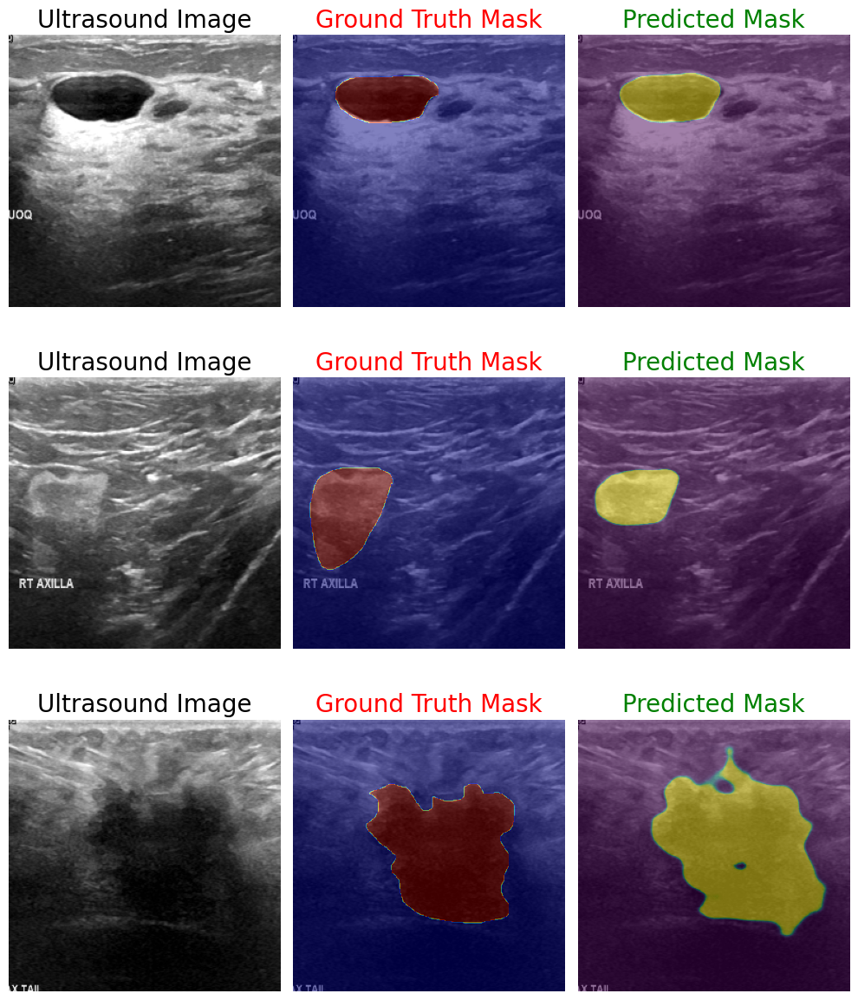

In [34]:
plot_predictions(X_test, 256, 10)

## **Model 5 Training**

In [ ]:
def preprocess_image(path, size):
    image = cv2.imread(path)
    image = cv2.resize(image, (size, size))
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image = image / 255.0
    return image

def create_dataset(size):
    images = []
    masks = []

    masks_detected = 0
    total_img= 1
    for image_path in sorted(glob(dataset_path)):
        #dont include the normal image folder in the dataset as it is not needed
        # if 'normal' in image_path:
        #     continue #skip the normal folder

        # else:
            img = preprocess_image(image_path, size)
            if '_mask' in image_path:
                if masks_detected:
                    masks[-1] = masks[-1] + img
                    masks[-1] = np.array(masks[-1]>0.5, dtype='float64')
                else:
                    masks.append(img)
                    masks_detected = 1
            else:
                images.append(img)
                masks_detected = 0

            total_img = total_img + 1
    return np.array(images), np.array(masks)

In [ ]:
size = 128
total_images, total_masks = load_dataset(size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks)

Data has been loaded successfully!
Total Images detected:  780
Total Masks detected:  780
Data has been shuffled successfully!
Total Images detected:  780
Total Masks detected:  780
Data has been reshaped successfully!
Training Images:  702
Validation Images:  39
Testing Images:  39
Data has been reshaped successfully!
Shape of Training Images:  (702, 128, 128, 1)
Shape of Training Masks:  (702, 128, 128, 1)
Shape of Validation Images:  (39, 128, 128, 1)
Shape of Validation Masks:  (39, 128, 128, 1)
Shape of Testing Images:  (39, 128, 128, 1)
Shape of Testing Masks:  (39, 128, 128, 1)


In [ ]:
input_size = 128
model_checkpoint = tf.keras.callbacks.ModelCheckpoint('model5_unet_customloss_128.h5', save_best_only=True)
model = unet_model(input_shape=(input_size, input_size, 1))
model.compile(optimizer=Adam(learning_rate=1e-4), loss=combined_loss, metrics=['accuracy' ,Precision(), Recall()])
model_history = model.fit(X_train, y_train, epochs = 100, validation_data = (X_val, y_val), callbacks=[tensorboard_callback, model_checkpoint])

Epoch 1/100
22/22 [==============================] - 26s 925ms/step - loss: 1.2246 - accuracy: 0.9201 - precision_38: 0.3054 - recall_38: 0.0054 - val_loss: 1.1763 - val_accuracy: 0.9146 - val_precision_38: 0.4384 - val_recall_38: 0.0806
Epoch 2/100
22/22 [==============================] - 6s 280ms/step - loss: 0.9790 - accuracy: 0.9182 - precision_38: 0.4801 - recall_38: 0.3339 - val_loss: 0.9552 - val_accuracy: 0.9299 - val_precision_38: 0.7136 - val_recall_38: 0.2701
Epoch 3/100
22/22 [==============================] - 6s 282ms/step - loss: 0.8146 - accuracy: 0.9201 - precision_38: 0.4982 - recall_38: 0.4661 - val_loss: 0.8066 - val_accuracy: 0.9213 - val_precision_38: 0.5333 - val_recall_38: 0.4974
Epoch 4/100
22/22 [==============================] - 5s 245ms/step - loss: 0.7815 - accuracy: 0.9259 - precision_38: 0.5396 - recall_38: 0.4845 - val_loss: 0.8270 - val_accuracy: 0.8983 - val_precision_38: 0.4283 - val_recall_38: 0.6240
Epoch 5/100
22/22 [==============================] 

In [ ]:
#Extract the weights to Google Drive
model.save_weights('model5_unet_customloss_128.h5')
!cp model5_unet_customloss_128.h5 /content/drive/MyDrive

## **Model 5 Testing**

In [41]:
#Need to rerun this to update the dataset!
def preprocess_image(path, size):
    image = cv2.imread(path)
    image = cv2.resize(image, (size, size))
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    image = image / 255.0
    return image

def create_dataset(size):
    images = []
    masks = []

    masks_detected = 0
    total_img= 1
    for image_path in sorted(glob(dataset_path)):
        #dont include the normal image folder in the dataset as it is not needed
        # if 'normal' in image_path:
        #     continue #skip the normal folder

        # else:
            img = preprocess_image(image_path, size)
            if '_mask' in image_path:
                if masks_detected:
                    masks[-1] = masks[-1] + img
                    masks[-1] = np.array(masks[-1]>0.5, dtype='float64')
                else:
                    masks.append(img)
                    masks_detected = 1
            else:
                images.append(img)
                masks_detected = 0

            total_img = total_img + 1
    return np.array(images), np.array(masks)

In [42]:
input_size = 128
total_images, total_masks = load_dataset(input_size)
X_train, X_val, X_test, y_train, y_val, y_test = get_dataset(total_images, total_masks, input_size)

# Define the model
model = unet_model(input_shape=(input_size, input_size, 1))

# Load the pretrained weights
model.load_weights('/content/drive/MyDrive/model5_unet_customloss_128.h5')

# Compile the model with the necessary configurations
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy', Precision(), Recall()])

# Print the model summary to check the architecture and parameters
#model.summary()

Data has been loaded successfully!
Total Images detected:  780
Total Masks detected:  780
Data has been shuffled successfully!
Total Images detected:  780
Total Masks detected:  780
Data has been reshaped successfully!
Training Images:  702
Validation Images:  39
Testing Images:  39
Data has been reshaped successfully!
Shape of Training Images:  (702, 128, 128, 1)
Shape of Training Masks:  (702, 128, 128, 1)
Shape of Validation Images:  (39, 128, 128, 1)
Shape of Validation Masks:  (39, 128, 128, 1)
Shape of Testing Images:  (39, 128, 128, 1)
Shape of Testing Masks:  (39, 128, 128, 1)


In [43]:
evaluate_model(X_test, y_test)

2/2 [==============================] - 3s 3s/step - loss: 0.4041 - accuracy: 0.9666 - precision_5: 0.7858 - recall_5: 0.7735
Model has been evaluated successfully!
Total Images:  39
Accuracy:  0.9665574431419373
Precision:  0.785773515701294
Recall:  0.7734577655792236
F1 Score:  0.779567002024907
Loss:  0.4040651321411133


In [44]:
#Test the model on the test dataset
y_pred = model.predict(X_test)

get_dicecoef(y_test, y_pred)

2/2 [==============================] - 0s 93ms/step
Dice Coefficient:  0.77913845
Correctly classified images with 50% similarity:  27
Correctly classified images with 70% similarity:  23
Correctly classified images with 90% similarity:  11
Total images:  39


2/2 [==============================] - 0s 94ms/step


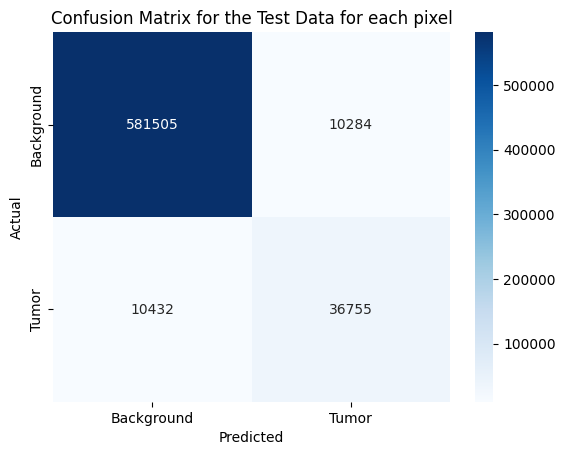

In [45]:
plot_evaluation_metrics(model, X_test, y_test)

2/2 [==============================] - 0s 97ms/step


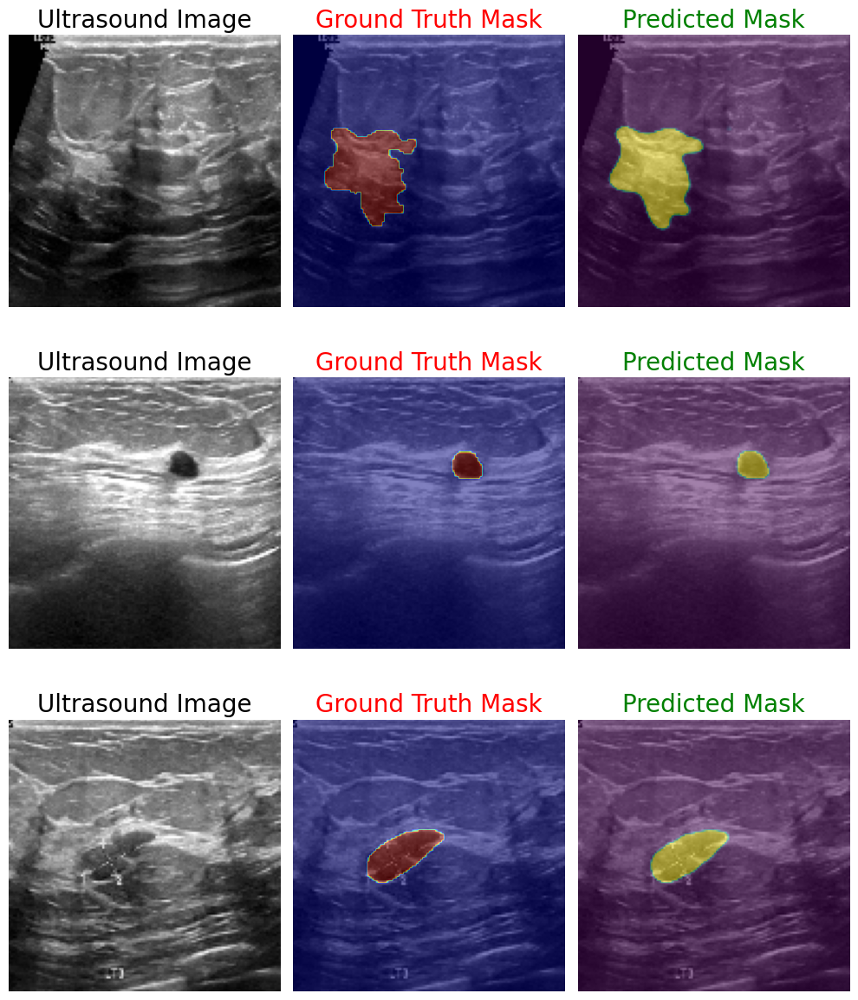

In [39]:
plot_predictions(X_test, 128, 5)